<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Introduction" data-toc-modified-id="Introduction-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Introduction</a></span></li><li><span><a href="#Setup" data-toc-modified-id="Setup-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Setup</a></span></li><li><span><a href="#Get-the-data" data-toc-modified-id="Get-the-data-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Get the data</a></span></li><li><span><a href="#Inspect-the-data" data-toc-modified-id="Inspect-the-data-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Inspect the data</a></span><ul class="toc-item"><li><span><a href="#Some-simple-observations" data-toc-modified-id="Some-simple-observations-4.1"><span class="toc-item-num">4.1&nbsp;&nbsp;</span>Some simple observations</a></span></li></ul></li><li><span><a href="#Prepare-the-data" data-toc-modified-id="Prepare-the-data-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Prepare the data</a></span></li><li><span><a href="#Explore-the-data" data-toc-modified-id="Explore-the-data-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>Explore the data</a></span></li><li><span><a href="#Feature-engineering:-creating-a-new-feature" data-toc-modified-id="Feature-engineering:-creating-a-new-feature-7"><span class="toc-item-num">7&nbsp;&nbsp;</span>Feature engineering: creating a new feature</a></span><ul class="toc-item"><li><span><a href="#Creating-a-new-feature" data-toc-modified-id="Creating-a-new-feature-7.1"><span class="toc-item-num">7.1&nbsp;&nbsp;</span>Creating a new feature</a></span></li></ul></li><li><span><a href="#Modelling" data-toc-modified-id="Modelling-8"><span class="toc-item-num">8&nbsp;&nbsp;</span>Modelling</a></span><ul class="toc-item"><li><span><a href="#Train-some-base-models" data-toc-modified-id="Train-some-base-models-8.1"><span class="toc-item-num">8.1&nbsp;&nbsp;</span>Train some base models</a></span></li><li><span><a href="#Tune-the-most-promising-models" data-toc-modified-id="Tune-the-most-promising-models-8.2"><span class="toc-item-num">8.2&nbsp;&nbsp;</span>Tune the most promising models</a></span></li><li><span><a href="#Ensemble-the-best-models" data-toc-modified-id="Ensemble-the-best-models-8.3"><span class="toc-item-num">8.3&nbsp;&nbsp;</span>Ensemble the best models</a></span></li><li><span><a href="#Pick-the-best-model" data-toc-modified-id="Pick-the-best-model-8.4"><span class="toc-item-num">8.4&nbsp;&nbsp;</span>Pick the best model</a></span></li></ul></li><li><span><a href="#Evaluate-model" data-toc-modified-id="Evaluate-model-9"><span class="toc-item-num">9&nbsp;&nbsp;</span>Evaluate model</a></span></li><li><span><a href="#Finalize-model-and-produce-predictions-on-the-test-set" data-toc-modified-id="Finalize-model-and-produce-predictions-on-the-test-set-10"><span class="toc-item-num">10&nbsp;&nbsp;</span>Finalize model and produce predictions on the test set</a></span><ul class="toc-item"><li><span><a href="#Crop-all-predictions-to-range-1-17" data-toc-modified-id="Crop-all-predictions-to-range-1-17-10.1"><span class="toc-item-num">10.1&nbsp;&nbsp;</span>Crop all predictions to range 1-17</a></span></li><li><span><a href="#Submit-to-our-Kaggle-challenge" data-toc-modified-id="Submit-to-our-Kaggle-challenge-10.2"><span class="toc-item-num">10.2&nbsp;&nbsp;</span>Submit to our Kaggle challenge</a></span></li></ul></li><li><span><a href="#Save-model" data-toc-modified-id="Save-model-11"><span class="toc-item-num">11&nbsp;&nbsp;</span>Save model</a></span></li></ul></div>

# Introduction

In this notebook, we'll use PyCaret to create and save a model. In the next notebook, we'll deploy the model by creating a simple web app.

> **Note:** This is far from a comprehensive example of building machine learning-powered applications. We'll keep things very simple. The goal is to get some exposure to some central ideas from machine learning engineering and some libraries that you can use to make simple prototype applications.

# Setup

In [1]:
# This is a quick check of whether the notebook is currently running on Google Colaboratory
# or on Kaggle, as that makes some difference for the code below.
# We'll do this in every notebook of the course.
try:
    import colab
    colab=True
except:
    colab=False

import os
kaggle = os.environ.get('KAGGLE_KERNEL_RUN_TYPE', '')

In [2]:
if (colab or kaggle):
    %pip install pycaret

In [3]:
import pycaret

In [4]:
print(pycaret.__version__)

2.3.10


In [5]:
%matplotlib inline
import pandas as pd, numpy as np

# Get the data

<img width=40% src="https://github.com/alu042/DAT158-2022/raw/main/notebooks/assets/hospital.png">

In this notebook, we'll look at how machine learning can be used on electronic health records data through a (small and simplified) example.

From data gathered from 100.000 patients, collected by Microsoft here https://microsoft.github.io/r-server-hospital-length-of-stay/index.html, we will try to predict the length of stay of patients admitted to various departments at the hospital. Such a system (if it was sufficiently robust and accurate) would be extremely valuable. For hospital resource management, i.e., managing personnel and planning for patient discharge at hospital departments.

By investigating what features have the largest explanatory power for a trained machine learning model, such a system could also potentially uncover interesting connections / hypotheses linking journal data and patient conditions.

In [6]:
train = pd.read_csv('https://github.com/alu042/DAT158-2022/raw/main/Kaggle/hospital/training_data.csv')
test = pd.read_csv('https://github.com/alu042/DAT158-2022/raw/main/Kaggle/hospital/test_data.csv')
DICT = pd.read_csv('https://github.com/alu042/DAT158-2022/raw/main/Kaggle/hospital/data_dictionary.csv')
METADATA = pd.read_csv('https://github.com/alu042/DAT158-2022/raw/main/Kaggle/hospital/metadata.csv')

# Inspect the data

In [7]:
train.head()

,id,vdate,rcount,gender,dialysisrenalendstage,asthma,irondef,pneum,substancedependence,psychologicaldisordermajor,...,sodium,glucose,bloodureanitro,creatinine,bmi,pulse,respiration,secondarydiagnosisnonicd9,facid,lengthofstay
0,76513,2012-07-05,4,M,False,False,False,False,False,True,...,137.150067,148.420532,23.0,0.955051,28.450268,63,6.7,1,E,7
1,60406,2012-02-26,1,M,False,False,False,False,False,False,...,140.643655,166.718526,9.0,1.385747,29.233048,81,6.5,0,B,3
2,27322,2012-11-19,1,F,False,False,False,False,False,False,...,138.459305,106.468142,12.0,0.816984,34.295535,75,6.5,1,B,5
3,53699,2012-01-30,0,F,False,False,False,False,False,False,...,138.667613,144.311236,12.0,1.082725,31.207914,75,6.5,1,B,2
4,65412,2012-09-04,3,F,False,True,False,False,False,False,...,133.463292,199.728635,12.0,1.081557,30.475797,89,6.5,7,D,8


In [8]:
DICT

,Index,Data fields,Type,Descriptions
0,NaN,LengthOfStay,NaN,NaN
1,1.0,eid,Integer,Unique Id of the hospital admission
2,2.0,vdate,String,Visit date
3,3.0,rcount,Integer,Number of readmissions within last 180 days
4,4.0,gender,String,Gender of the patient\nM or F
5,5.0,dialysisrenalendstage,String,Flag for renal disease during encounter
6,6.0,asthma,String,Flag for asthma during encounter
7,7.0,irondef,String,Flag for iron deficiency during encounter
8,8.0,pneum,String,Flag for pneumonia during encounter
9,9.0,substancedependence,String,Flag for substance dependence during encounter


In [9]:
METADATA.head()

,Capacity,Id,Name
0,30,C,General Medicine 3 South
1,95,E,Behavioral 1 East
2,75,A,General Medicine 3 West
3,80,B,Pulmonary 2 West
4,100,D,Geriatrics 2 East


## Some simple observations



It seems that `LOS` is our primary source of information. `DICT` provides useful information about the features in `LOS`, while `METADATA` contains information about the various hospital departments the data is collected from.

> Note that `rcount = 5` means five _or more_ visits over the past 180 days.

# Prepare the data

We use PyCaret to automatically prepare the data for us (using the default settings of the `setup` function):

In [10]:
from pycaret.regression import *

In [11]:
experiment = setup(train, target = 'lengthofstay')

,Description,Value
0,session_id,3946
1,Target,lengthofstay
2,Original Data,"(70000, 27)"
3,Missing Values,True
4,Numeric Features,10
5,Categorical Features,15
6,Ordinal Features,False
7,High Cardinality Features,False
8,High Cardinality Method,None
9,Transformed Train Set,"(48999, 68)"


# Explore the data

This is, of course, one of the most important parts of any machine learning project. We won't go into detail here.

In [12]:
from pandas_profiling import ProfileReport

In [13]:
ProfileReport(train)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Feature engineering: creating a new feature

Some features are more important than others for our model. In other words, some features describe the patients in a more expedient way than others and are of greater value for our predictive model.

> But these are not necessarily the best features!

One of the most important parts of machine learning (albeit often underappreciated) is **feature engineering**.

As we've learned, machine learning is basically about **function approximation**. You want to find a function that is as close as possible to the true function mapping from the set of features to correct label or value.

$$y \approx f(x; \theta)$$

> In general, the more _complicated_ the true function is, the harder it is for the machine learning model.

By describing the raw data with new, more suitable features, it is possible to reduce the complexity of the true function. As an extreme example, if we had used the date of entry and date of exit for each of our patients, then the true function could be very simple: exit minus entry equals the length of stay.

There's a lot of room between doing nothing and actually putting the label as a feature (which is, of course, not useful). That's what feature engineering is about.

The best way to do feature engineering is to influence how the data is collected. Then it's possible to add new features that one believes could be useful for modelling (for example, we could add the patient's age in our example).

If you cannot influence data collection, one should rather think as follows: (i) bring in external features (f.ex. if we had the patients' personal identification numbers, we could access other databases containing more information), or (ii) create new features by combining the ones we have.

> Any real-life machine learning project will involve some feature engineering!

## Creating a new feature

Each patient is associated to a number of flags for different conditions:
```
 'dialysisrenalendstage',
 'asthma',
 'irondef',
 'pneum',
 'substancedependence',
 'psychologicaldisordermajor',
 'depress',
 'psychother',
 'fibrosisandother',
 'malnutrition',
 'hemo'
 ```

In [14]:
train.head()

,id,vdate,rcount,gender,dialysisrenalendstage,asthma,irondef,pneum,substancedependence,psychologicaldisordermajor,...,sodium,glucose,bloodureanitro,creatinine,bmi,pulse,respiration,secondarydiagnosisnonicd9,facid,lengthofstay
0,76513,2012-07-05,4,M,False,False,False,False,False,True,...,137.150067,148.420532,23.0,0.955051,28.450268,63,6.7,1,E,7
1,60406,2012-02-26,1,M,False,False,False,False,False,False,...,140.643655,166.718526,9.0,1.385747,29.233048,81,6.5,0,B,3
2,27322,2012-11-19,1,F,False,False,False,False,False,False,...,138.459305,106.468142,12.0,0.816984,34.295535,75,6.5,1,B,5
3,53699,2012-01-30,0,F,False,False,False,False,False,False,...,138.667613,144.311236,12.0,1.082725,31.207914,75,6.5,1,B,2
4,65412,2012-09-04,3,F,False,True,False,False,False,False,...,133.463292,199.728635,12.0,1.081557,30.475797,89,6.5,7,D,8


In [15]:
DICT

,Index,Data fields,Type,Descriptions
0,NaN,LengthOfStay,NaN,NaN
1,1.0,eid,Integer,Unique Id of the hospital admission
2,2.0,vdate,String,Visit date
3,3.0,rcount,Integer,Number of readmissions within last 180 days
4,4.0,gender,String,Gender of the patient\nM or F
5,5.0,dialysisrenalendstage,String,Flag for renal disease during encounter
6,6.0,asthma,String,Flag for asthma during encounter
7,7.0,irondef,String,Flag for iron deficiency during encounter
8,8.0,pneum,String,Flag for pneumonia during encounter
9,9.0,substancedependence,String,Flag for substance dependence during encounter


Let's make a feature that simply counts all the issues per patient. The idea is that the number of issues influences the length of stay, and if we add it as a feature we make it simpler for the model to pick up on this.

In [16]:
issues = ['dialysisrenalendstage',
 'asthma',
 'irondef',
 'pneum',
 'substancedependence',
 'psychologicaldisordermajor',
 'depress',
 'psychother',
 'fibrosisandother',
 'malnutrition',
 'hemo']

**NB:** Because of a bug in the current version of PyCaret where any `custom_pipeline` isn't used by PyCaret's `setup` method, we do this outside PyCaret's preprocessing steps.

In [17]:
# Doesn't work as of Nov 2022 because of a PyCaret bug

#from sklearn.base import BaseEstimator, TransformerMixin

#class NumIssuesFeature(BaseEstimator, TransformerMixin):
#    def __init__(self):
#        pass
#    def fit( self, X, y = None ):
#        return self
#    def transform(self, X, y=None):
#        X["numberofissues"] = X[issues].astype('int').sum(axis=1)
#        return X

#experiment = setup(train, target = 'lengthofstay', 
#                   custom_pipeline=[("numberofissues_feature", NumIssuesFeature())])

_We need to deal with NaN values manually as we're not using PyCaret for this part of the preprocessing_

In [18]:
from sklearn.impute import SimpleImputer

In [19]:
imp = SimpleImputer(strategy='most_frequent')

In [20]:
train[issues] = imp.fit_transform(train[issues])
test[issues] = imp.transform(test[issues])

In [21]:
train.insert(len(train.columns)- 1, 'numberofissues', train[issues].astype('int').sum(axis=1))

In [22]:
test.insert(len(test.columns)- 1, 'numberofissues', test[issues].astype('int').sum(axis=1))

In [23]:
train.head()

,id,vdate,rcount,gender,dialysisrenalendstage,asthma,irondef,pneum,substancedependence,psychologicaldisordermajor,...,glucose,bloodureanitro,creatinine,bmi,pulse,respiration,secondarydiagnosisnonicd9,facid,numberofissues,lengthofstay
0,76513,2012-07-05,4,M,False,False,False,False,False,True,...,148.420532,23.0,0.955051,28.450268,63,6.7,1,E,1,7
1,60406,2012-02-26,1,M,False,False,False,False,False,False,...,166.718526,9.0,1.385747,29.233048,81,6.5,0,B,0,3
2,27322,2012-11-19,1,F,False,False,False,False,False,False,...,106.468142,12.0,0.816984,34.295535,75,6.5,1,B,0,5
3,53699,2012-01-30,0,F,False,False,False,False,False,False,...,144.311236,12.0,1.082725,31.207914,75,6.5,1,B,0,2
4,65412,2012-09-04,3,F,False,True,False,False,False,False,...,199.728635,12.0,1.081557,30.475797,89,6.5,7,D,1,8


In [24]:
experiment = setup(train, target='lengthofstay')

,Description,Value
0,session_id,6033
1,Target,lengthofstay
2,Original Data,"(70000, 28)"
3,Missing Values,True
4,Numeric Features,10
5,Categorical Features,16
6,Ordinal Features,False
7,High Cardinality Features,False
8,High Cardinality Method,None
9,Transformed Train Set,"(48999, 75)"


# Modelling

## Train some base models

Let's find the top performing models from those in PyCaret:

In [25]:
top4 = compare_models(n_select=4, sort='R2')

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
catboost,CatBoost Regressor,0.2851,0.1446,0.3802,0.9739,0.0899,0.1006,1.5630
xgboost,Extreme Gradient Boosting,0.3169,0.1817,0.4263,0.9672,0.0985,0.1123,2.4390
lightgbm,Light Gradient Boosting Machine,0.3099,0.1860,0.4312,0.9664,0.1011,0.1125,0.0790
gbr,Gradient Boosting Regressor,0.3846,0.2680,0.5176,0.9516,0.1145,0.1389,1.3750
rf,Random Forest Regressor,0.3750,0.3965,0.6294,0.9284,0.1183,0.1029,4.6550
et,Extra Trees Regressor,0.4836,0.5189,0.7201,0.9063,0.1385,0.1468,3.8480
dt,Decision Tree Regressor,0.4706,0.8034,0.8961,0.8549,0.1672,0.1220,0.0980
ridge,Ridge Regression,0.8362,1.1860,1.0888,0.7859,0.2353,0.2995,0.0210
br,Bayesian Ridge,0.8362,1.1860,1.0888,0.7859,0.2353,0.2995,0.0890
lar,Least Angle Regression,0.8393,1.1983,1.0942,0.7836,0.2362,0.2994,0.0230


## Tune the most promising models

_This takes some time..._

In [ ]:
tune=False

In [26]:
if tune:
    tuned_top4 = [tune_model(i) for i in top4]

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.3678,0.2455,0.4955,0.9553,0.1129,0.1295
1,0.3739,0.2525,0.5025,0.9546,0.1112,0.1280
2,0.3660,0.2446,0.4945,0.9550,0.1105,0.1256
3,0.3831,0.2647,0.5145,0.9521,0.1154,0.1330
4,0.3777,0.2634,0.5132,0.9529,0.1132,0.1306
5,0.3554,0.2310,0.4806,0.9579,0.1089,0.1249
6,0.3691,0.2491,0.4991,0.9547,0.1128,0.1293
7,0.3680,0.2544,0.5044,0.9531,0.1118,0.1263
8,0.3725,0.2509,0.5009,0.9570,0.1113,0.1284


## Ensemble the best models

Let's create bagging ensembles for all our top models:

In [27]:
bagged_top4 = [ensemble_model(i) for i in top4]

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.3864,0.2687,0.5184,0.9511,0.1162,0.1412
1,0.3876,0.2763,0.5256,0.9504,0.1117,0.1357
2,0.3833,0.2720,0.5215,0.9500,0.1144,0.1377
3,0.3775,0.2544,0.5044,0.9540,0.1141,0.1393
4,0.3906,0.2764,0.5257,0.9506,0.1151,0.1408
5,0.3756,0.2526,0.5026,0.9540,0.1129,0.1376
6,0.3851,0.2598,0.5097,0.9527,0.1162,0.1418
7,0.3840,0.2721,0.5216,0.9499,0.1146,0.1389
8,0.3890,0.2728,0.5223,0.9532,0.1143,0.1390


We can also try to blend the models (i.e., have them vote using a `VotingRegressor`):

In [32]:
blender = blend_models(estimator_list = top4)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.3167,0.1725,0.4153,0.9686,0.0983,0.1159
1,0.3172,0.1749,0.4183,0.9686,0.0940,0.1114
2,0.3133,0.1709,0.4135,0.9686,0.0972,0.1138
3,0.3103,0.1660,0.4074,0.9700,0.0971,0.1148
4,0.3176,0.1738,0.4169,0.9689,0.0968,0.1149
5,0.3087,0.1624,0.4029,0.9704,0.0960,0.1139
6,0.3160,0.1674,0.4091,0.9695,0.0982,0.1165
7,0.3110,0.1727,0.4156,0.9682,0.0972,0.1132
8,0.3184,0.1745,0.4177,0.9701,0.0969,0.1142


...or stack them (i.e., train a model to figure out how to blend the models):

In [29]:
stacked = stack_models(estimator_list = top4)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.2826,0.1442,0.3798,0.9738,0.0913,0.1013
1,0.2810,0.1402,0.3744,0.9748,0.0864,0.0965
2,0.2804,0.1429,0.3780,0.9737,0.0902,0.0993
3,0.2802,0.1429,0.3780,0.9741,0.0910,0.1008
4,0.2807,0.1431,0.3782,0.9744,0.0896,0.0993
5,0.2804,0.1402,0.3744,0.9745,0.0899,0.1003
6,0.2858,0.1464,0.3826,0.9734,0.0920,0.1022
7,0.2788,0.1460,0.3822,0.9731,0.0912,0.0987
8,0.2869,0.1500,0.3873,0.9743,0.0912,0.1013


## Pick the best model

Now we've trained a bunch of models (all the individual models + the ensemble + the blended models). Instead of sorting through all the models to pick what's best we can let PyCaret do it for us using the `automl` method:

In [30]:
best = automl(optimize='R2')

Here's the best model we've found in the above experiments:

In [31]:
best

StackingRegressor(cv=5,
                  estimators=[('catboost',
                               <catboost.core.CatBoostRegressor object at 0x7fc6bae897c0>),
                              ('xgboost',
                               XGBRegressor(base_score=0.5, booster='gbtree',
                                            callbacks=None, colsample_bylevel=1,
                                            colsample_bynode=1,
                                            colsample_bytree=1,
                                            early_stopping_rounds=None,
                                            enable_categorical=False,
                                            eval_metric=None,
                                            feature_types=None, gamma=0,
                                            gpu_id=-1, grow_policy...
                                                         min_samples_leaf=1,
                                                         min_samples_split=2,
          

# Evaluate model

We can find predictions on the test data set aside by PyCaret:

In [33]:
preds = predict_model(best)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Stacking Regressor,0.2862,0.1490,0.3861,0.9733,0.0909,0.1002


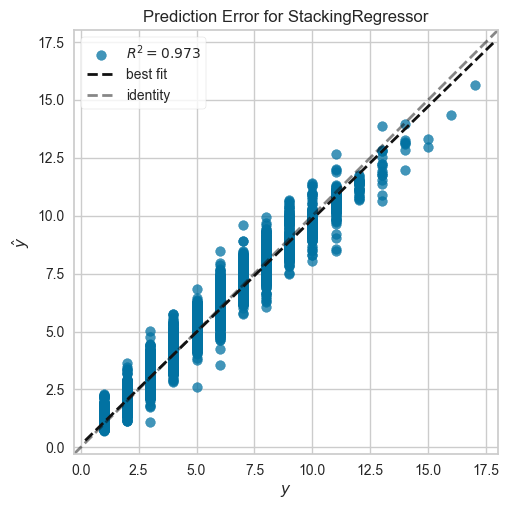

In [34]:
plot_model(best, 'error')

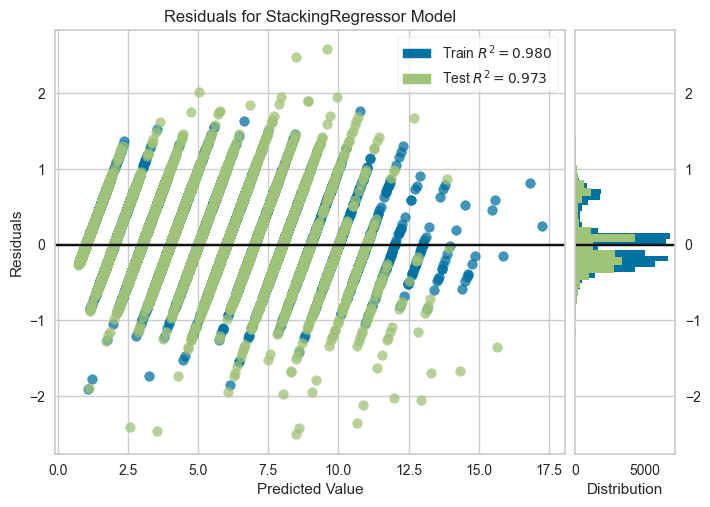

In [35]:
plot_model(best)

We can also plot **learning curves**. As you recall, that's a plot of the performance versus the amount of training data given to the model. Among other things, such plots can indicate whether having more data (of the same kind) would increase performance, and provide an estimate of how much it would increase.

This takes a long time to compute so I've attached the output as an image below.

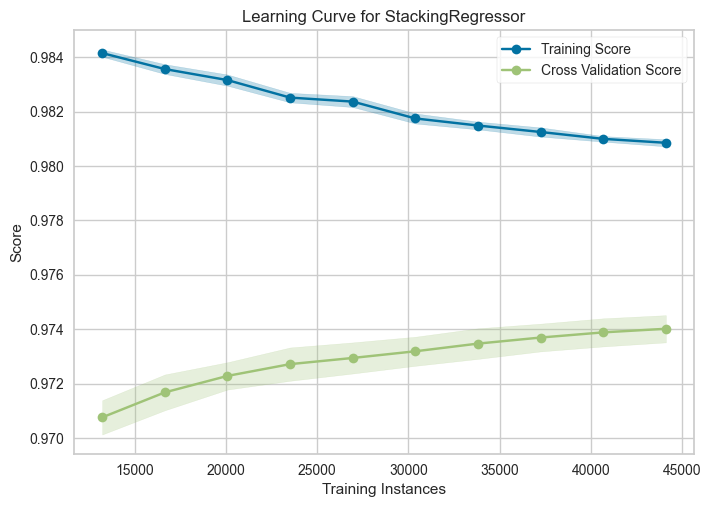

In [36]:
plot_model(best, 'learning')

<img src="https://github.com/alu042/DAT158-2022/raw/main/notebooks/assets/pycaret_hospital_learning_curve.png">

In [76]:
evaluate_model(best)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

# Finalize model and produce predictions on the test set

We can retrain the best model on all the data (including the test data set aside by PyCaret):

In [37]:
final_model = finalize_model(best)

Remember that we had a separate, unseen test dataset (stored in the dataframe `test`) without labels:

In [38]:
test_preds = predict_model(best, data = test)

In [40]:
test_preds.head(10)

,id,vdate,rcount,gender,dialysisrenalendstage,asthma,irondef,pneum,substancedependence,psychologicaldisordermajor,...,glucose,bloodureanitro,creatinine,bmi,pulse,respiration,secondarydiagnosisnonicd9,numberofissues,facid,Label
0,75721,2012-01-23,0,F,False,False,False,False,False,False,...,141.479044,12.0,0.676542,28.702016,70,5.9,2,0,A,1.743911
1,80184,2012-12-09,0,F,False,False,False,False,False,False,...,184.433689,12.0,1.520272,29.702723,62,6.5,1,0,A,2.622479
2,19864,2012-06-05,4,F,False,True,True,False,False,False,...,185.799872,8.5,1.137023,29.984780,68,5.3,1,2,D,7.817194
3,76699,2012-06-14,0,F,False,False,False,False,False,False,...,113.951944,12.0,0.845051,32.509896,84,6.5,2,0,B,2.630005
4,92991,2012-08-07,0,F,False,False,False,False,False,False,...,111.787840,12.0,0.814372,29.870887,88,6.5,1,0,B,4.026848
5,76434,2012-04-28,3,F,False,False,False,False,False,False,...,133.355931,12.0,1.113024,31.203525,72,6.5,1,0,B,5.037465
6,84004,2012-03-31,0,F,False,False,False,False,False,False,...,124.608123,12.0,0.765734,28.860068,89,6.5,4,0,A,1.705085
7,80917,2012-08-04,0,F,False,False,False,False,False,False,...,121.362008,12.0,1.014761,29.806375,74,6.5,1,0,A,0.875580
8,60767,2012-05-10,0,M,False,False,False,False,False,True,...,128.511516,8.0,0.953300,32.249281,72,7.5,1,2,E,3.623997
9,50074,2012-02-08,0,M,False,False,False,False,False,False,...,88.794545,6.0,0.862924,31.010304,91,6.5,2,0,A,2.453912


We note that our model sometimes makes predictions that are below 1 or above 17. However, we know that no instances can have values outside the range 1-17.

## Crop all predictions to range 1-17

In [42]:
train_labels = get_config('y_train')

In [44]:
np.min(test_preds.Label), np.max(test_preds.Label)

(0.7292776127395733, 15.583831756917464)

In [45]:
np.min(train_labels), np.max(train_labels)

(1, 17)

In [54]:
test_preds_cropped = list(test_preds.Label)
for i in range(len(test_preds)):
    if test_preds_cropped[i] < 1:
        test_preds_cropped[i] = 1.
    if test_preds_cropped[i] > 17:
        test_preds_cropped[i] = 17.

## Submit to our Kaggle challenge

Remember that this data is from the voluntary Kaggle competition organized in DAT158. Let's check how our model performs on the leaderboard.

In [57]:
sample_submission = pd.read_csv('https://github.com/alu042/DAT158-2022/raw/main/Kaggle/hospital/sample_submission.csv')

In [58]:
submission = sample_submission.copy()

In [59]:
submission.lengthofstay = test_preds_cropped

In [60]:
submission.head()

,id,lengthofstay
0,75721,1.743911
1,80184,2.622479
2,19864,7.817194
3,76699,2.630005
4,92991,4.026848


In [62]:
submission.to_csv('pycaret_hospital_submission.csv', index=None)

In [63]:
submission.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 2 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   id            30000 non-null  int64  
 1   lengthofstay  30000 non-null  float64
dtypes: float64(1), int64(1)
memory usage: 468.9 KB


# Save model

In [64]:
save_model(final_model, 'saved_hospital_model_071122')

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=[],
                                       display_types=True, features_todrop=[],
                                       id_columns=[], ml_usecase='regression',
                                       numerical_features=[],
                                       target='lengthofstay',
                                       time_features=[])),
                 ('imputer',
                  Simple_Imputer(categorical_strategy='not_available',
                                 fill_value_categorical=None,
                                 fill_value_numerical=None,
                                 numeric_str...
                                                                           min_samples_split=2,
                                                                           min_weight_fraction_leaf=0.0,
                                                                         